# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 
---

## Import Packages

In [1]:
#
# Project1 Find Road Lines in a Video
#

# Imports
import matplotlib.image as mpimg
import pickle
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

## Pipeline to process an image and overlay Line annotations

Next Cal image: 0
Next Cal image: 1
Next Cal image: 2
Next Cal image: 3
Next Cal image: 4
Next Cal image: 5
Next Cal image: 6
Next Cal image: 7
Next Cal image: 8
Next Cal image: 9
Next Cal image: 10
Next Cal image: 11
Next Cal image: 12
Next Cal image: 13
Next Cal image: 14
Next Cal image: 15
Next Cal image: 16
Next Cal image: 17
Next Cal image: 18
Next Cal image: 19


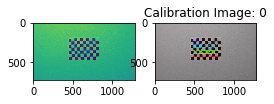

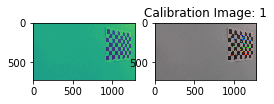

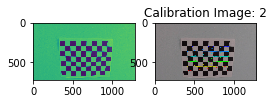

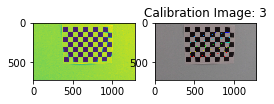

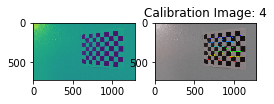

...

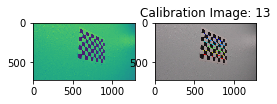

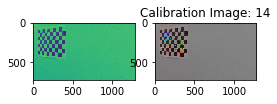

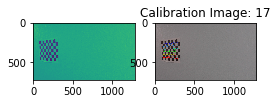

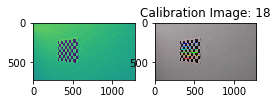

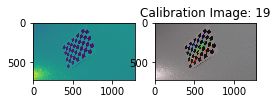

In [10]:
## Step 1. Perform camera calibration via chessboard method
nx = 9
ny = 6
cell_w = 1
cell_h = 20

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

def findCorners(displayit = True):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)


    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        if displayit:
            print("Next Cal image: " + str(idx))
        
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            if displayit:
                # Draw and display the corners
                cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
                fig, (before, img_box) = plt.subplots(1, 2, figsize=(4,4))
                before.imshow(gray)
                img_box.imshow(img)
                plt.title("Calibration Image: " + str(idx))
            
findCorners()


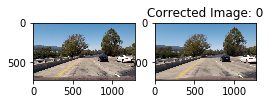

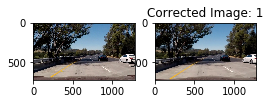

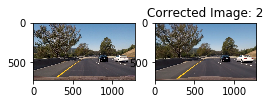

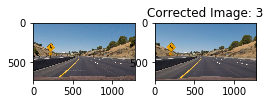

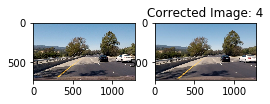

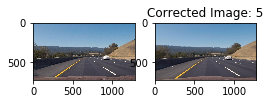

In [15]:
# Step 2. undistort images
import pickle
%matplotlib inline

def undistort_image(img):
    img = cv2.bilateralFilter(img,9,75,75)

    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    #dst = correct_color(dst)
    return dst

def undistort_image_file(imgFile):
    img = cv2.imread(imgFile)
    return undistort_image(img)

processed_images = []
img_files = glob.glob('test_images/test*.jpg')
for imgFile in img_files:
    processed_images.append(undistort_image_file(imgFile))
    
idx=0    
for img in processed_images:    
    fig, (orig_img, img_box) = plt.subplots(1, 2, figsize=(4,4))
    orig_img.imshow(cv2.cvtColor(cv2.imread(img_files[idx]), cv2.COLOR_BGR2RGB))
    img_box.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Corrected Image: " + str(idx))
    idx+=1


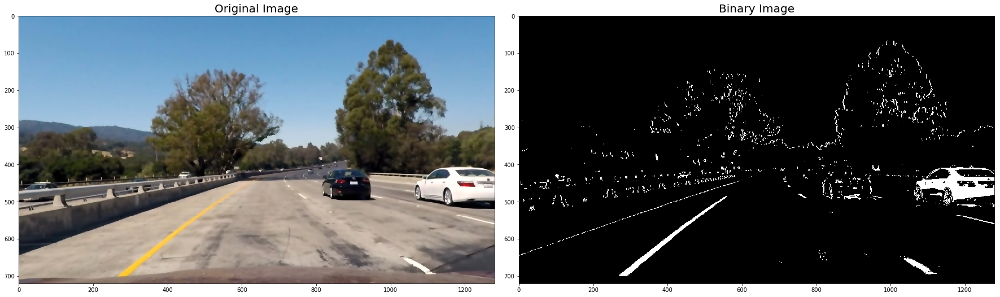

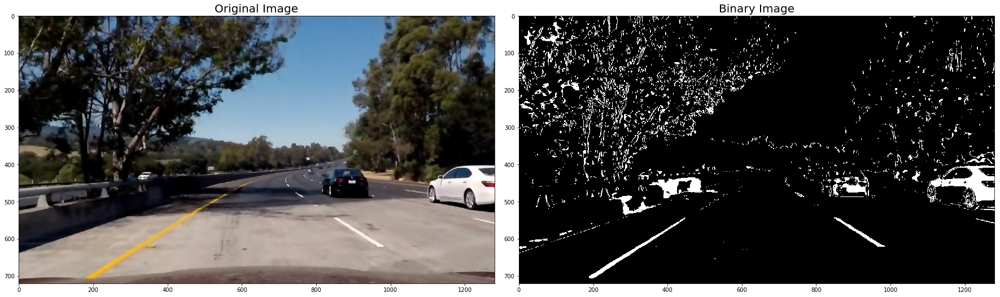

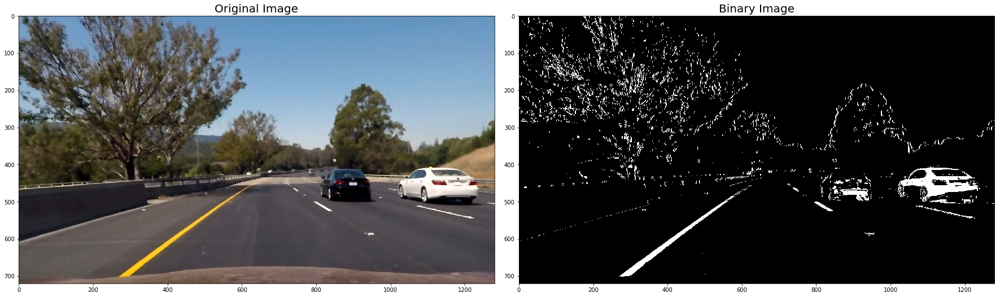

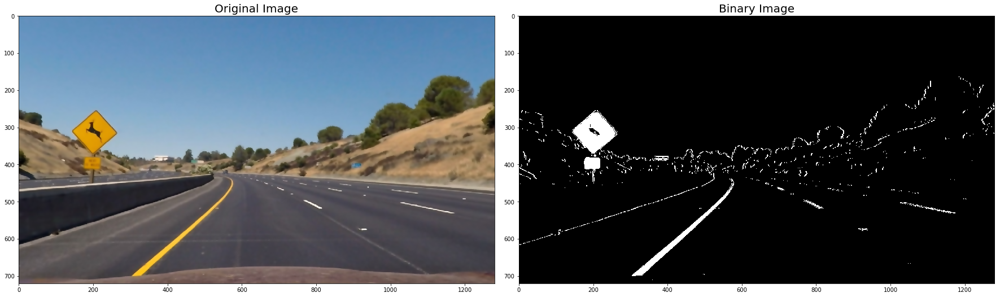

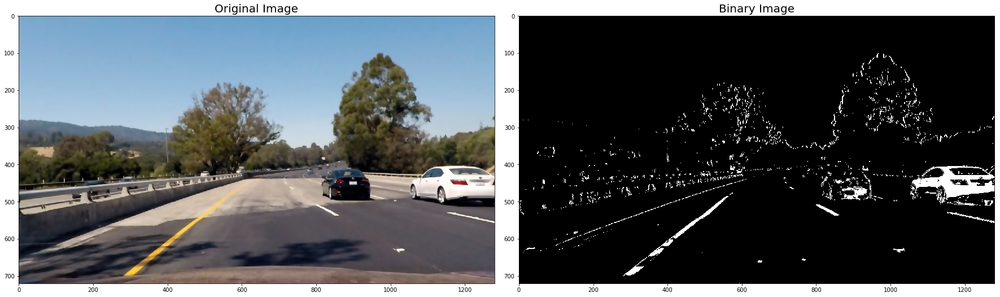

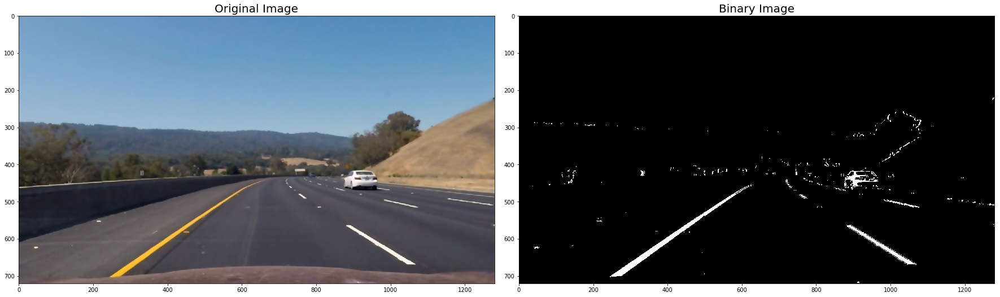

In [4]:
#Step 3. Use color transforms, gradients, etc., to create a thresholded binary image.

def to_binary_sobel(img, s_thresh=(175,255), sx_thresh=(35, 100), gray_thresh=[220, 255]):
    img = np.copy(img)
    
    # get yellow channel
    yellow = get_color_image(img, [0, 190, 255], [190,255,255])
    yellow = cv2.cvtColor(yellow, cv2.COLOR_BGR2GRAY)
    yellow_bin = np.zeros_like(yellow)
    yellow_bin[(yellow >= gray_thresh[0]) & (yellow <= gray_thresh[1])]=1  
    
    # get white channel
    ## normal
    white = get_color_image(img, [175, 195, 215], [255,255,255])
    white = cv2.cvtColor(white, cv2.COLOR_BGR2GRAY)
    white_bin = np.zeros_like(white)
    white_bin[(white >= gray_thresh[0]) & (white <= gray_thresh[1])]=1  

    # Convert to HLS color space and separate the SL channels
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x filter as in lecture
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel, more yellow
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Create the binary image of all the above channels
    color_binary = np.zeros_like(s_binary)
    color_binary[(sxbinary == 1) | (s_binary == 1) | (white_bin == 1) | (yellow_bin == 1)] = 1

    return color_binary


def get_color_image(img, lower, upper):
    mask = cv2.inRange(img, np.array(lower, dtype = "uint8"), np.array(upper, dtype = "uint8"))
    out_img = cv2.bitwise_and(img, img, mask = mask)
    return out_img
    
binary_images = []
for img in processed_images:
    img_binary = to_binary_sobel(img)
    binary_images.append(img_binary)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(img_binary, cmap='gray')
    ax2.set_title('Binary Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

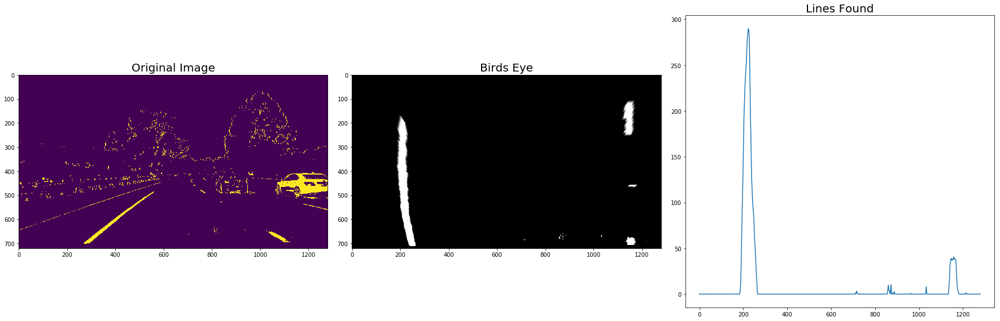

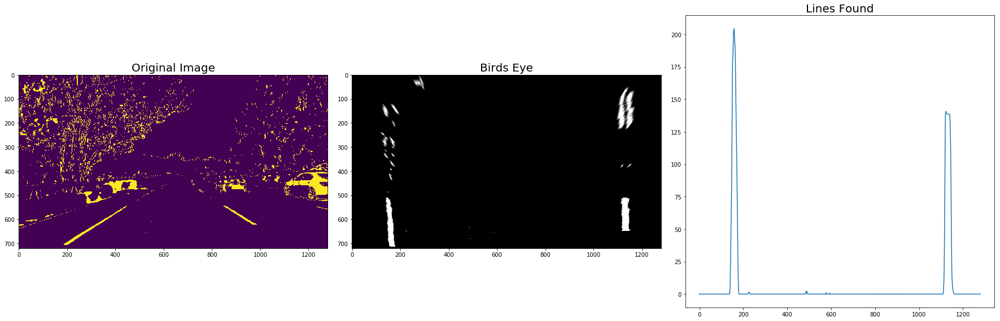

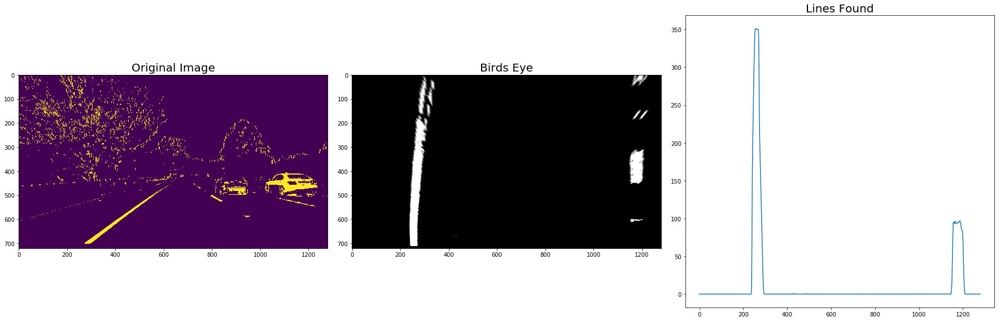

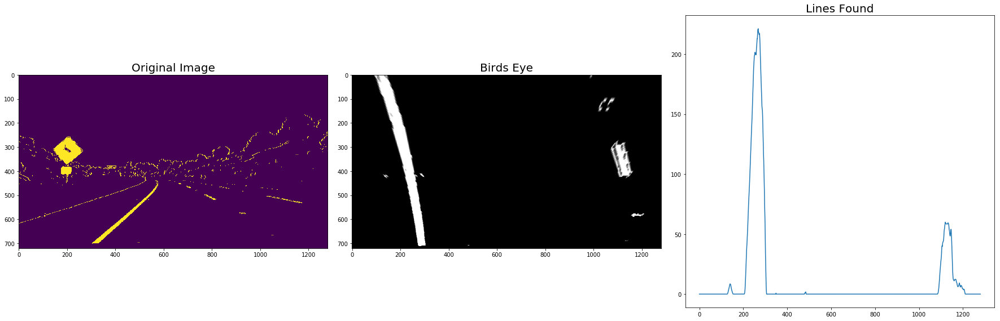

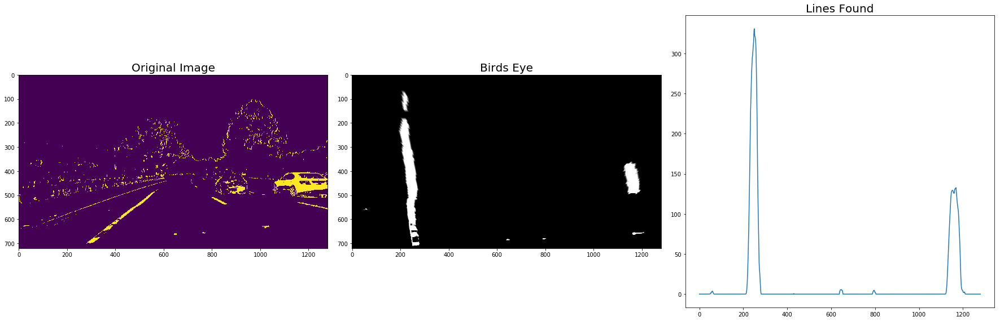

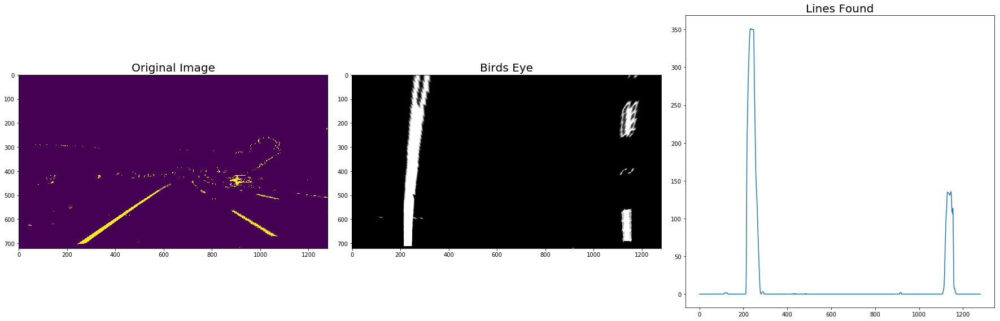

In [5]:
# Step 4: Apply a perspective transform to rectify binary image ("birds-eye view").

def getPerspective():
    ##TAKEN FROM sTRIAGHT LINES IMAGE 1
#    src = np.float32([[520, 485],[795, 485], [1265, 720],[30, 720]])
    src = np.float32([[545, 470],[762, 470], [1265, 720],[30, 720]])
    dst = np.float32([[0, 0], [1280, 0], [1265, 720],[30, 720]])
    return (src, dst)

def to_birdseye(img):
    img_size = (img.shape[1], img.shape[0])
    offset = 0
    
    per = getPerspective()
    
    M = cv2.getPerspectiveTransform(per[0], per[1])
    warped_img = cv2.warpPerspective(img, M, img_size)
    return warped_img

birdseye_images = []
birdseye_color_images = []

for img in processed_images:
    birdseye_color_images.append(to_birdseye(img))

for img in binary_images:    
    bin_img = to_birdseye(img)

    kernel = np.ones((5,5), np.uint8)
    bin_img = cv2.dilate(bin_img, kernel, iterations=1)
    bin_img = cv2.erode(bin_img, kernel, iterations=1)

    birdseye_images.append(bin_img)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(bin_img, cmap='gray')
    ax2.set_title('Birds Eye', fontsize=20)
    histogram = np.sum(bin_img[bin_img.shape[0]//2:,:], axis=0)
    ax3.plot(histogram)
    ax3.set_title('Lines Found', fontsize=20)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


last delta:  223 : 1158
lost lane
2006.278413 m 9993.46910185 m
last delta:  65 : 36
lost lane
2545.41754341 m 1870.13908397 m
last delta:  33 : 27
1915.36842219 m 3969.20097151 m
last delta:  45 : 65
lost lane
1750.87422711 m 2192.76881852 m
last delta:  27 : 17
7828.65926061 m 1769.65573811 m
Lanes lost and rescanned:  3


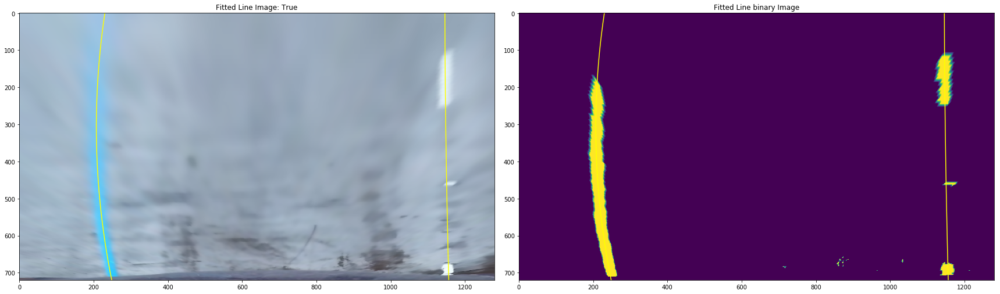

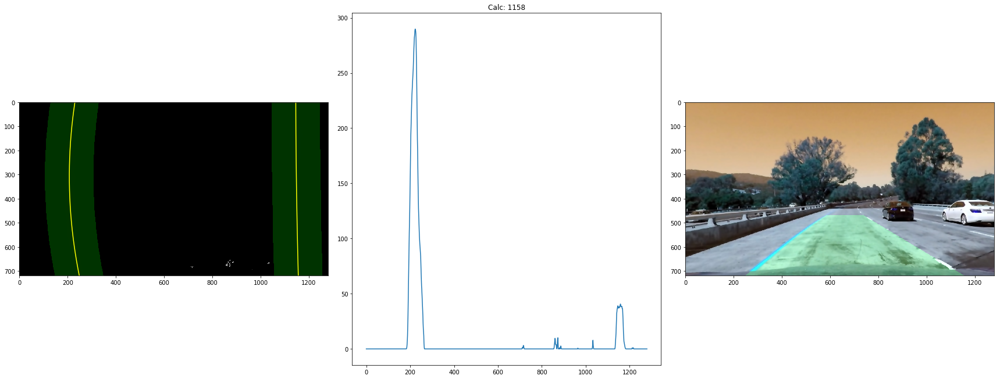

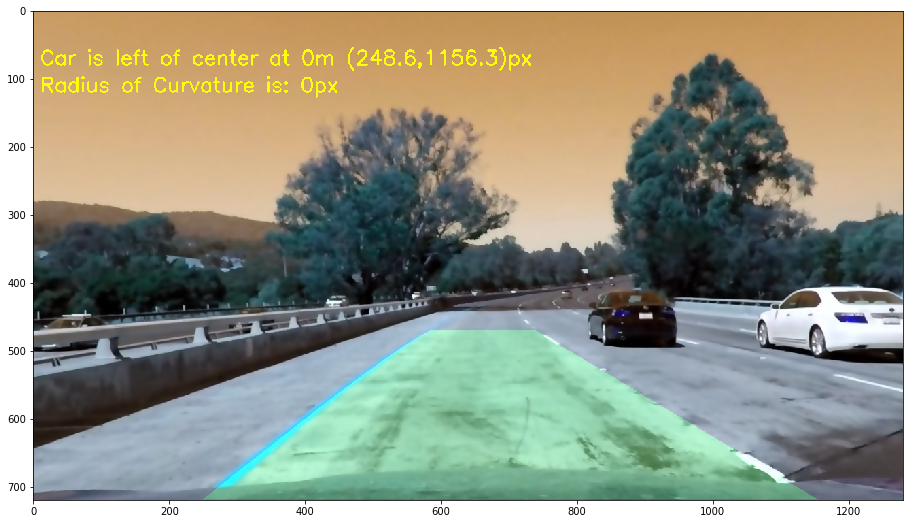

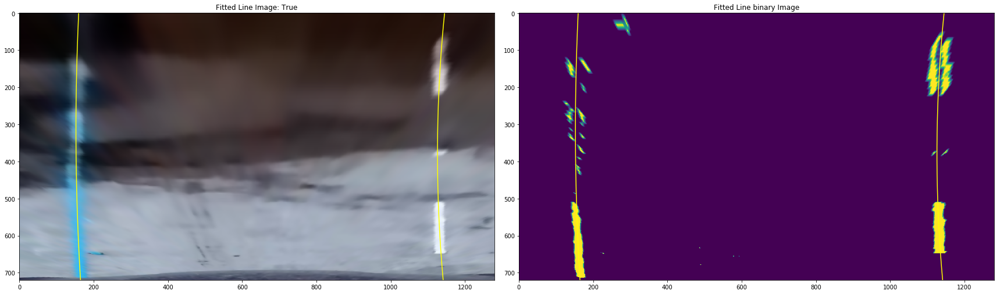

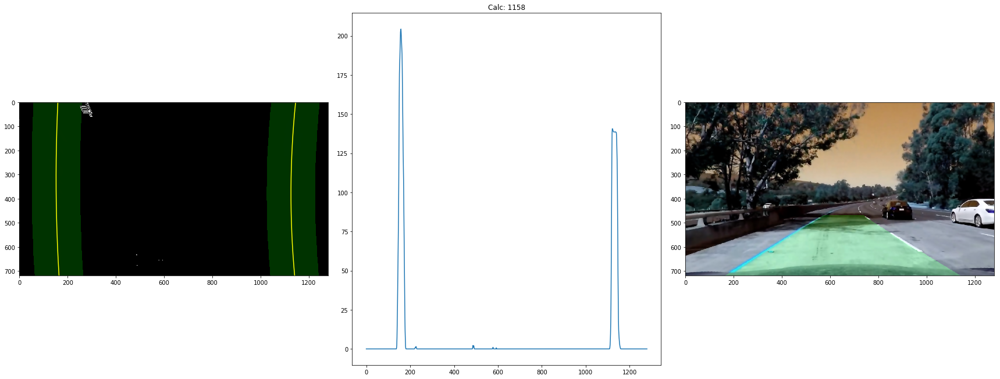

...

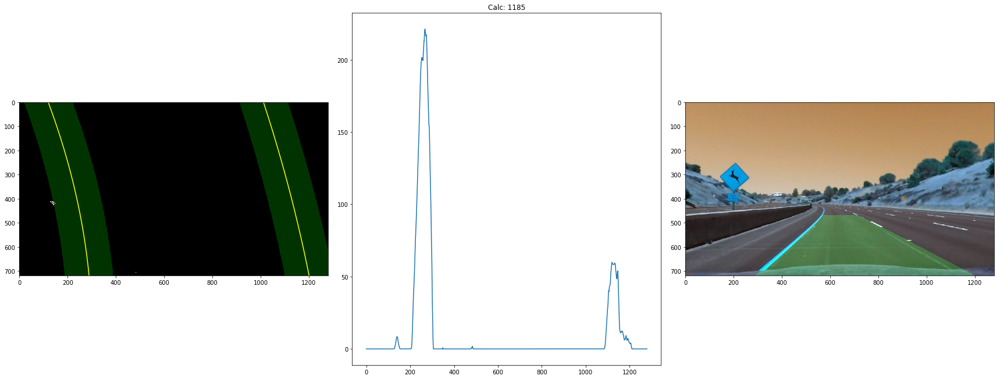

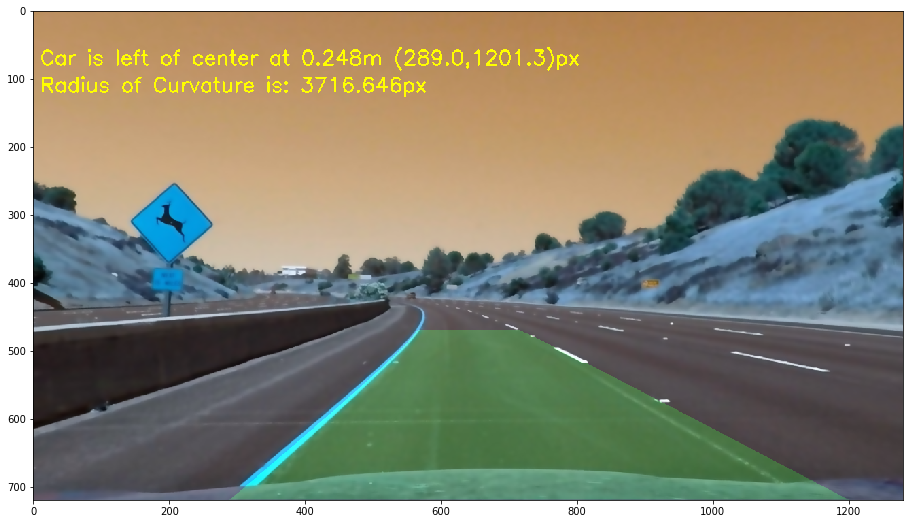

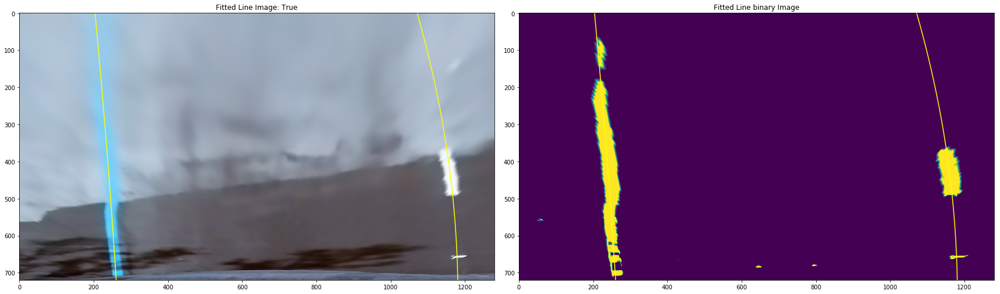

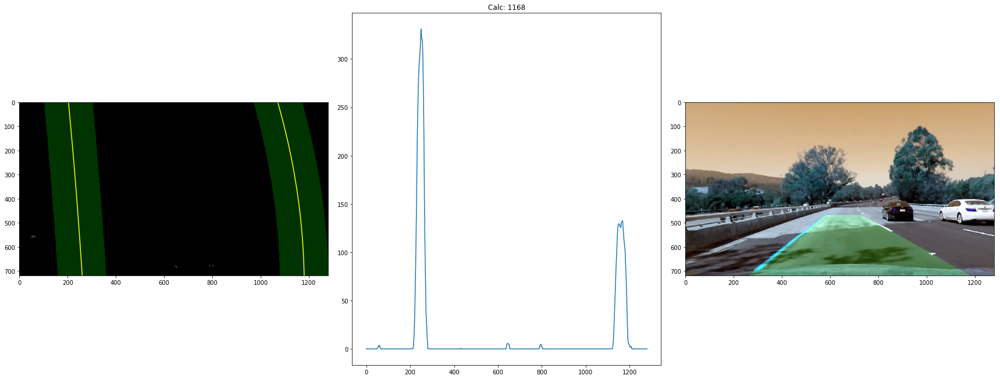

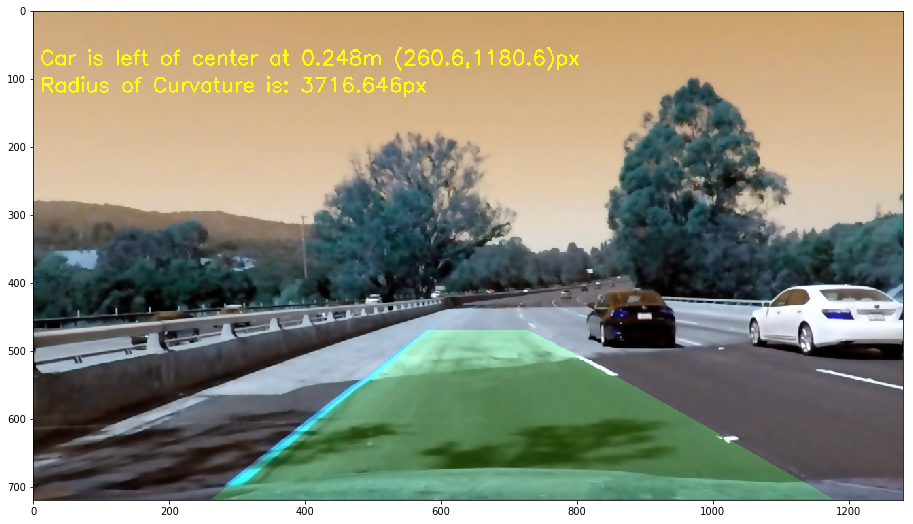

In [6]:
#Step 6: Detect lane pixels and fit to find the lane boundary.

# Create empty lists to receive left and right lane pixel indices
def window_search(binary_warped, color_img, leftx_base, rightx_base, diplayit):    
    # Choose the number of sliding windows
    nwindows = 11
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 60
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    return (left_lane_inds, right_lane_inds)

def get_peak_pos(hist, st, ed, midpoint=0):
    x_base = np.argmax(hist[st:ed]) + midpoint
    
    x_base_next = np.argmax(hist[x_base:ed]) + midpoint
    
    delta = abs(hist[x_base] - hist[x_base_next]) 
    if hist[x_base] > hist[x_base_next] and delta > 5 :
        return x_base

    if hist[x_base_next] == 0.0:
        return x_base

    return get_peak_pos(histogram, x_base+10, ed, midpoint)


def fill_poly(binary_warped, warped, clean_img, displayit):
    global g_last_leftx_base
    global g_last_rightx_base
    global g_left_fit
    global g_right_fit

    global g_moving_mean
    global g_center_offset
    global center_offset

    global radius_of_curvature
    global lost_lane_ctn
    global initialized

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)

    leftx_base = get_peak_pos(histogram, 0, midpoint)
    rightx_base = get_peak_pos(histogram, midpoint, histogram.shape[0], midpoint)
        
    delta_l = abs(g_last_leftx_base - leftx_base) 
    delta_r = abs(g_last_rightx_base - rightx_base) 
    
    if displayit:
        print ("last delta: ", delta_l, ":", delta_r)
    
    if (delta_l < 40) and (delta_r < 40):
        initialized = True
        g_last_leftx_base - leftx_base
        g_last_rightx_base = rightx_base
        # need to search as something jumped
    else:
        initialized = False

    if g_last_rightx_base > midpoint and g_last_rightx_base < rightx_base:
        g_last_rightx_base = rightx_base

    margin = 100

    left_lane_inds = [] 
    right_lane_inds = []
    
    if not initialized:
        initialized = True

        lost_lane_ctn += 1
        if displayit:
            print("lost lane")
            
        if g_last_leftx_base == 0 and g_last_rightx_base == 0:
            g_last_leftx_base = leftx_base
            g_last_rightx_base = rightx_base
            
        # if the lane NOT found from sliding search, do a hard search 
        (left_lane_inds, right_lane_inds) = window_search(binary_warped, clean_img, g_last_leftx_base, g_last_rightx_base, False)    

    else:
        left_lane_inds = ((nonzerox > (g_left_fit[0]*(nonzeroy**2) + g_left_fit[1]*nonzeroy + 
        g_left_fit[2] - margin)) & (nonzerox < (g_left_fit[0]*(nonzeroy**2) + 
        g_left_fit[1]*nonzeroy + g_left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (g_right_fit[0]*(nonzeroy**2) + g_right_fit[1]*nonzeroy + 
        g_right_fit[2] - margin)) & (nonzerox < (g_right_fit[0]*(nonzeroy**2) + 
        g_right_fit[1]*nonzeroy + g_right_fit[2] + margin)))  
        
        # done sliding windows technique
          
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    g_left_fit = left_fit
    g_right_fit = right_fit


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    if displayit:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(to_birdseye(clean_img))
        ax1.plot(left_fitx, ploty, color='yellow')
        ax1.plot(right_fitx, ploty, color='yellow')
        ax1.set_title("Fitted Line Image: "+ str(initialized))
        ax2.imshow(binary_warped)
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.set_title('Fitted Line binary Image')
        
    # visualize
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    if displayit:
        f2, (aax1, aax2, aax3) = plt.subplots(1, 3, figsize=(24, 9))
        f2.tight_layout()
        aax1.imshow(result)
        aax1.plot(left_fitx, ploty, color='yellow')
        aax1.plot(right_fitx, ploty, color='yellow')
        aax2.plot(histogram)
        aax2.set_title("Calc: " + str(g_last_rightx_base))

        
    # lets go ahead and find the real workd position
    # aka radius of curvature and center offset
        
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(lefty)  # *ym_per_pix
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    if displayit:
        print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    radius_of_curvature_tmp = (left_curverad + right_curverad) / 2.0
    if len(g_moving_mean) > 2:
        radius_of_curvature = np.mean(g_moving_mean)
        g_moving_mean = []
    g_moving_mean.append(radius_of_curvature_tmp)
    
    # rewarp back to vehicle position
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    # center assumed vehicle camera is at the center of the vehicle,
    # and that means the image, aka 1280x720
    virtual_center = 1280 / 2
    vehicle_centerline = abs(virtual_center - ((rightx_int+leftx_int)/2))
    # convert pixel to meters distance based on fhta specification
    center_offset_tmp = vehicle_centerline*0.00528
    if len(g_center_offset) > 2:
        center_offset = np.mean(g_center_offset)
        g_center_offset = []
    g_center_offset.append(center_offset_tmp)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # redo matrix
    per = getPerspective()    
    Minv = cv2.getPerspectiveTransform(per[1], per[0])

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(clean_img, 1, newwarp, 0.2, 0)
    
    if displayit:
        aax3.imshow(result)

    heading_txt = "Car is "

    # visualize it...
    
    if vehicle_centerline > virtual_center: # right of
        heading_txt += "right of center at " + str(format(round(center_offset,3))) + "m (" 
    else:
        heading_txt += "left of center at " + str(format(round(center_offset,3))) + "m (" 
        
    heading_txt += str(format(round(leftx_int,1))) + "," + str(format(round(rightx_int,1))) + ")px"
    
    
    radius_txt = "Radius of Curvature is: " + str(format(round(radius_of_curvature,3))) + "px"

    cv2.putText(result, 
            heading_txt, 
            (10, 80),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.0,
            (255, 255, 0), 
            2);
    cv2.putText(result, 
            radius_txt, 
            (10, 120),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.0,
            (255, 255, 0), 
            2);
        
    return result


left_fit = 0
right_fit = 0
g_left_lane_inds = []
g_right_lane_inds = []
g_left_fit = []
g_right_fit = []
g_moving_mean = []
g_center_offset = []
center_offset = 0
radius_of_curvature = 0
g_last_leftx_base = 0
g_last_rightx_base = 0
lost_lane_ctn = 0
initialized = False

#debug    
for idx in range(0,5):
    img = birdseye_images[idx]    
    res = fill_poly(img, birdseye_color_images[idx], processed_images[idx], True)
    f, (ax1) = plt.subplots(1, figsize=(24, 9))
    ax1.imshow(res)
    
print("Lanes lost and rescanned: ", lost_lane_ctn)


In [7]:
#
# Project pipeline
#

from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(img):
    img =  undistort_image(img)
    img_binary = to_binary_sobel(img)
    img_warped = to_birdseye(img_binary)
    img_warped_color = to_birdseye(img)    
    dst = fill_poly(img_warped, img_warped_color, img, False)
    return dst    

#
# PIPELINE
#
left_fit = 0
right_fit = 0
g_left_lane_inds = []
g_right_lane_inds = []
g_left_fit = []
g_right_fit = []
g_moving_mean = []
g_center_offset = []
center_offset = 0
radius_of_curvature = 0
g_last_leftx_base = 0
g_last_rightx_base = 0
lost_lane_ctn = 0
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

initialized = False
print("start pipeline")

findCorners(False)
video_output = 'output.mp4'
#clip1 = VideoFileClip("project_video.mp4").subclip(23,25)
#clip1 = VideoFileClip("project_video.mp4").subclip(41,42)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) 
white_clip.write_videofile(video_output, audio=False)
print("Lanes lost and rescanned: ", lost_lane_ctn)


start pipeline
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [14:30<00:00,  1.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

Lanes lost and rescanned:  635


In [8]:
initialized = False
print("start pipeline")
video_output = 'output_challenge.mp4'
clip1 = VideoFileClip("challenge_video.mp4").subclip(1,2)
white_clip = clip1.fl_image(process_image)
white_clip.write_videofile(video_output, audio=False)
print("Lanes lost and rescanned: ", lost_lane_ctn)



start pipeline
[MoviePy] >>>> Building video output_challenge.mp4
[MoviePy] Writing video output_challenge.mp4


100%|██████████| 30/30 [00:19<00:00,  1.50it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_challenge.mp4 

Lanes lost and rescanned:  666


In [9]:
initialized = False
video_output = 'output_harder_challenge.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(1,2)
white_clip = clip1.fl_image(process_image)
white_clip.write_videofile(video_output, audio=False)


[MoviePy] >>>> Building video output_harder_challenge.mp4
[MoviePy] Writing video output_harder_challenge.mp4


 96%|█████████▌| 25/26 [00:17<00:00,  1.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_harder_challenge.mp4 

